# Outbreak Simulator - Small: W=2

In [1]:
from SpatialScan.region import *
from SpatialScan.likelihood import *
from SpatialScan.results import *
from SpatialScan.scan import *
from SpatialScan.synthetic import *
from SpatialScan.timeseries import *
from SpatialScan.preprocessing import *

import pandas as pd

## Set Model Parameters

In [2]:
# Set these Variables First
OUTBREAK_LENGTH=5
NORMAL_ANALYSIS_DAYS=7
DAYS_IN_PAST=28
DAYS_IN_FUTURE=2

# Outbreak size
SEVERITY=8

LON_MIN = -0.349749335498348
LON_MAX = -0.25056950567589603
LAT_MIN = 51.45083323706079
LAT_MAX = 51.5408981075881

## Get Synthetic data from File

In [3]:
synth_df = pd.read_csv("../data/simulation/synthetic_scoot_april_june.csv", infer_datetime_format=True, parse_dates=[1, 4])
synth_df = synth_df[(synth_df['lon'].between(LON_MIN, LON_MAX)) & (synth_df['lat'].between(LAT_MIN, LAT_MAX))]

In [4]:
total_days_of_required_data = OUTBREAK_LENGTH + NORMAL_ANALYSIS_DAYS + DAYS_IN_PAST
total_days_of_required_data

40

In [5]:
t_min = synth_df['measurement_end_utc'].max() - np.timedelta64(total_days_of_required_data, 'D')
forecast_start = t_min + np.timedelta64(DAYS_IN_PAST, 'D')
first_analysis_day = forecast_start + np.timedelta64(DAYS_IN_FUTURE, 'D')
synth_df = synth_df[synth_df['measurement_start_utc'] >= t_min].copy()

Now have 40 days worth of data in Ealing

In [6]:
synth_df

,detector_id,measurement_end_utc,lon,lat,measurement_start_utc,n_vehicles_in_interval,rolling_threshold,global_threshold,Num_Anom,Num_Missing
504,N24/002b1,2020-04-26 01:00:00,-0.285622,51.462133,2020-04-26 00:00:00,29,247.292989,308.356339,0.0,10
505,N24/002b1,2020-04-26 02:00:00,-0.285622,51.462133,2020-04-26 01:00:00,33,247.983082,308.356339,0.0,10
506,N24/002b1,2020-04-26 03:00:00,-0.285622,51.462133,2020-04-26 02:00:00,12,247.845462,308.356339,0.0,10
507,N24/002b1,2020-04-26 04:00:00,-0.285622,51.462133,2020-04-26 03:00:00,17,248.284142,308.356339,0.0,10
508,N24/002b1,2020-04-26 05:00:00,-0.285622,51.462133,2020-04-26 04:00:00,74,249.285030,308.356339,0.0,10
...,...,...,...,...,...,...,...,...,...,...
671971,N28/140g1,2020-06-04 20:00:00,-0.276751,51.538122,2020-06-04 19:00:00,404,1339.610887,972.069431,0.0,4
671972,N28/140g1,2020-06-04 21:00:00,-0.276751,51.538122,2020-06-04 20:00:00,255,1337.103390,972.069431,0.0,4
671973,N28/140g1,2020-06-04 22:00:00,-0.276751,51.538122,2020-06-04 21:00:00,26,1340.919715,972.069431,0.0,4
671974,N28/140g1,2020-06-04 23:00:00,-0.276751,51.538122,2020-06-04 22:00:00,126,1343.364932,972.069431,0.0,4


## Get Historical Data from file (30 days with same settings for now)

In [7]:
hist = pd.read_csv('30_day_null_simulation_files/highest.csv')
hist.drop(['l_score_075', 'l_score_100'], axis=1, inplace=True)
hist.rename({'l_score_basic': 'l_score_EBP'}, inplace=True, axis=1)

In [8]:
hist.head(5)

,x_min,x_max,y_min,y_max,t_min,t_max,l_score_EBP,l_score_000,l_score_025,l_score_050,day
0,-0.275364,-0.262967,51.528227,51.539188,2020-05-03 07:00:00,2020-05-05 00:00:00,1.000358,0.000518,0.000032,-0.000086,2020-05-05 00:00:00
1,-0.300159,-0.275364,51.495345,51.506306,2020-05-04 06:00:00,2020-05-06 00:00:00,1.000201,0.000492,-0.000043,-0.001000,2020-05-06 00:00:00
2,-0.275364,-0.262967,51.517267,51.528227,2020-05-05 01:00:00,2020-05-07 00:00:00,1.000442,0.001460,-0.000074,-0.002445,2020-05-07 00:00:00
3,-0.287762,-0.275364,51.506306,51.517267,2020-05-07 21:00:00,2020-05-08 00:00:00,1.000227,0.000266,0.000192,0.000138,2020-05-08 00:00:00
4,-0.349749,-0.337352,51.451503,51.462464,2020-05-08 23:00:00,2020-05-09 00:00:00,1.000083,0.000104,0.000072,0.000049,2020-05-09 00:00:00


## Simulate an Outbreak which lasts for the last `OUTBREAK_LENGTH` days

In [9]:
outbreak_df, outbreak_detectors, outbreak_start = simulate_outbreak(synth_df, severity=SEVERITY, k_min=1, k_max=75, outbreak_duration=OUTBREAK_LENGTH)

Outbreak centred at (-0.295034837756049, 51.5321338356957) affecting 50 detectors
['N27/130b1' 'N27/101q1' 'N27/102b1' 'N27/101c1' 'N27/101a1' 'N27/101a2'
 'N27/102a1' 'N27/101b2' 'N27/101b1' 'N27/102x2' 'N27/100c1' 'N27/100x1'
 'N27/004b1' 'N27/100b1' 'N27/100s1' 'N27/004a1' 'N27/130a1' 'N27/130a2'
 'N27/004x2' 'N27/102c2' 'N27/004f3' 'N27/004g1' 'N27/004g2' 'N27/004f1'
 'N27/004f2' 'N27/010d1' 'N27/093e1' 'N27/010c1' 'N27/245b1' 'N27/011a1'
 'N27/018b1' 'N27/247x1' 'N27/169a1' 'N27/018e1' 'N28/140g1' 'N27/247a1'
 'N27/071a1' 'N27/018f1' 'N27/247f1' 'N27/247e1' 'N27/090b1' 'N27/169b1'
 'N27/011d1' 'N27/093g1' 'N27/018d1' 'N27/169c1' 'N27/219b1' 'N27/219b2'
 'N27/044c1' 'N27/011h1']
Start of outbreak: 2020-05-31 00:00:00


Text(2020-05-26 00:00:00, 1500, 'Analysis Begins')

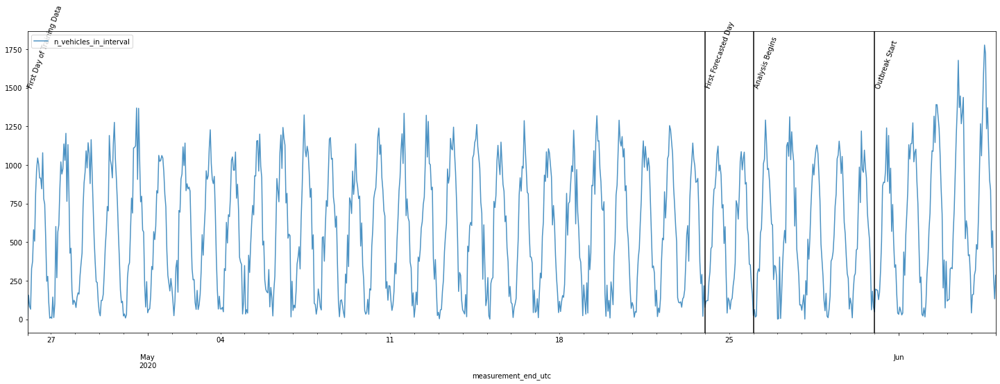

In [10]:
outbreak_df[outbreak_df['detector_id'] == 'N27/011a1'].plot(x='measurement_end_utc', y='n_vehicles_in_interval', figsize=(25, 8), alpha=0.8)
plt.axvline(x=outbreak_start, c='k')
plt.text(outbreak_start,1500,'Outbreak Start',rotation=70, size=10)

plt.axvline(x=t_min, c='k')
plt.text(t_min,1500,'First Day of Training Data',rotation=70, size=10)

plt.axvline(x=forecast_start, c='k')
plt.text(forecast_start ,1500,'First Forecasted Day',rotation=70, size=10)

plt.axvline(x=first_analysis_day, c='k')
plt.text(first_analysis_day,1500,'Analysis Begins',rotation=70, size=10)

Total number of days in dataframe:  40
Producing forecasts and scans for 11 days in total.

Outbreak begins at 2020-05-31 00:00:00.

Analysis day: 2020-05-26 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-05-26 00:00:00.
Using data from 2020-04-26 00:00:00 to 2020-05-24 00:00:00, to forecast counts
 between 2020-05-24 00:00:00 and 2020-05-26 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


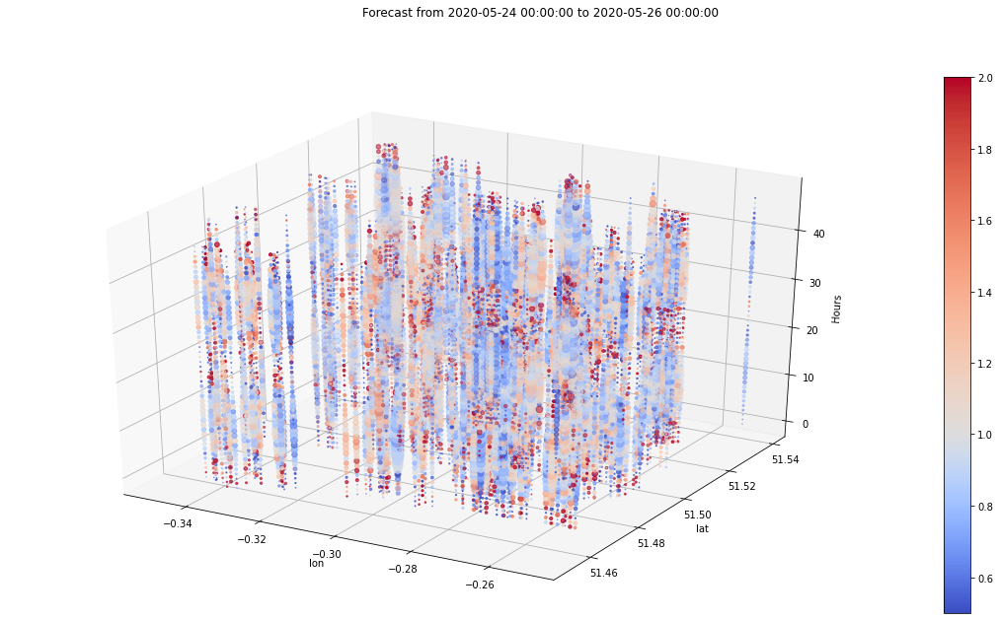

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 9.45 seconds
Search spatial regions with t_min = 2020-05-24 00:00:00 and t_max = 2020-05-26 00:00:00
No Outbreak Posterior: 0.9934126478548675
Total Outbreak Posterior: 0.006587352145132648

32448 space-time regions searched in 102.61 seconds
Total run time: 112.06 seconds


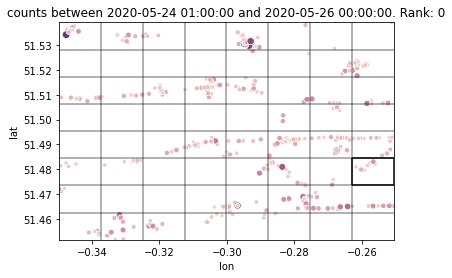


Analysis day: 2020-05-27 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-05-27 00:00:00.
Using data from 2020-04-27 00:00:00 to 2020-05-25 00:00:00, to forecast counts
 between 2020-05-25 00:00:00 and 2020-05-27 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


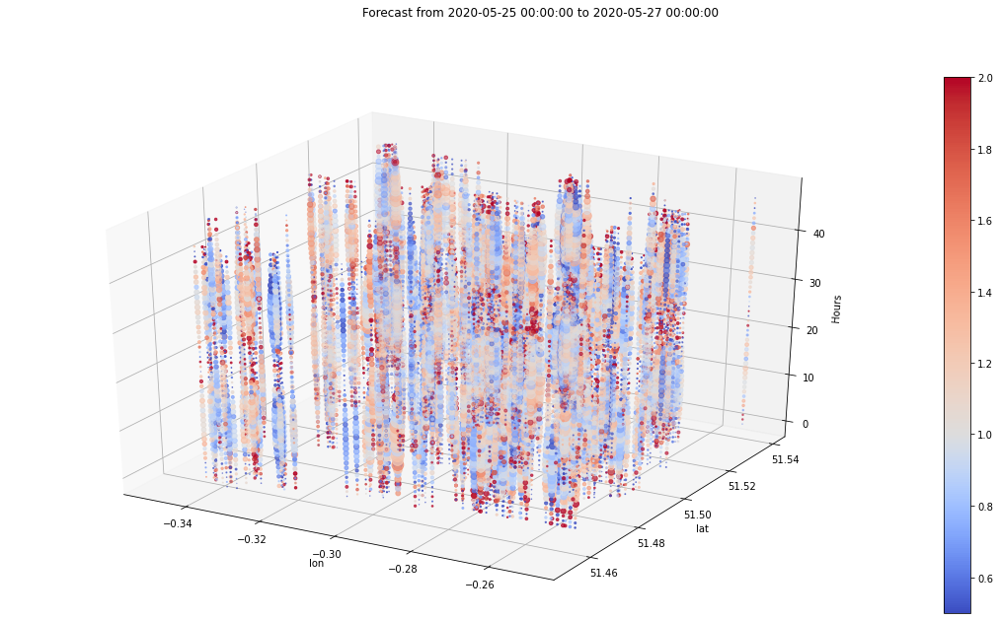

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.34 seconds
Search spatial regions with t_min = 2020-05-25 00:00:00 and t_max = 2020-05-27 00:00:00
No Outbreak Posterior: 0.9934505835084205
Total Outbreak Posterior: 0.0065494164915794895

32448 space-time regions searched in 96.33 seconds
Total run time: 104.68 seconds


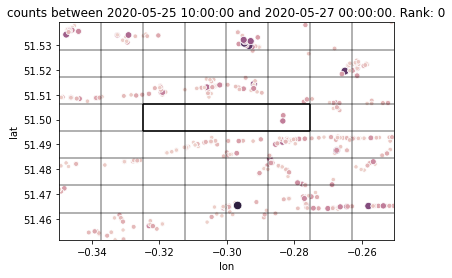


Analysis day: 2020-05-28 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-05-28 00:00:00.
Using data from 2020-04-28 00:00:00 to 2020-05-26 00:00:00, to forecast counts
 between 2020-05-26 00:00:00 and 2020-05-28 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


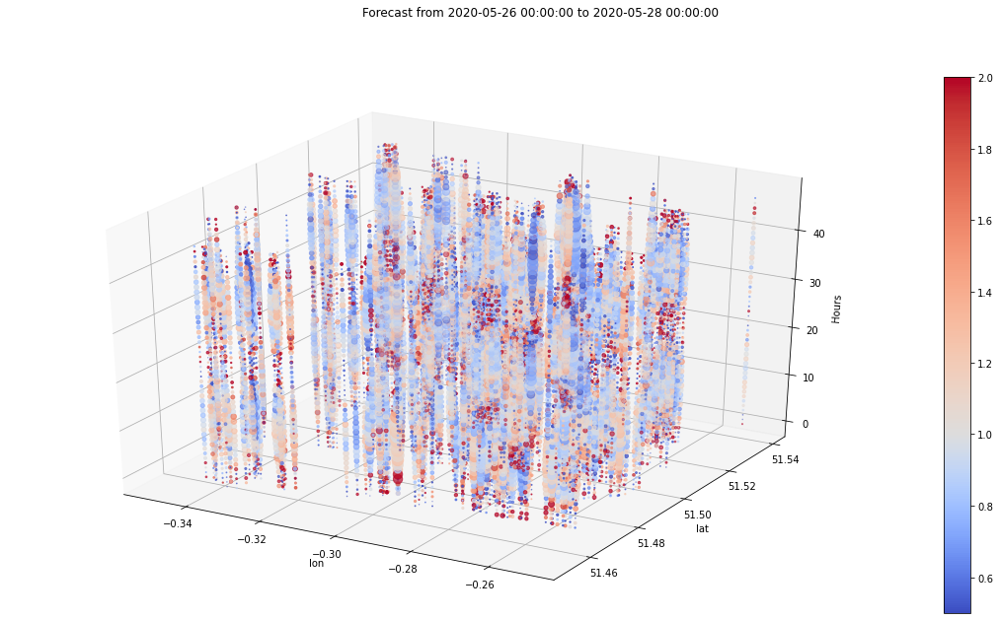

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.91 seconds
Search spatial regions with t_min = 2020-05-26 00:00:00 and t_max = 2020-05-28 00:00:00
No Outbreak Posterior: 0.9933974333349784
Total Outbreak Posterior: 0.006602566665021582

32448 space-time regions searched in 91.53 seconds
Total run time: 100.44 seconds


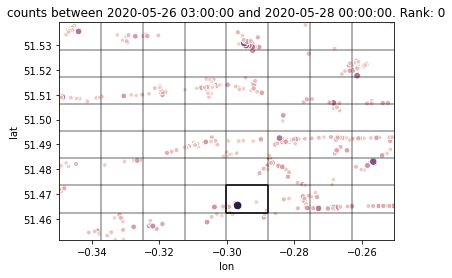


Analysis day: 2020-05-29 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-05-29 00:00:00.
Using data from 2020-04-29 00:00:00 to 2020-05-27 00:00:00, to forecast counts
 between 2020-05-27 00:00:00 and 2020-05-29 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


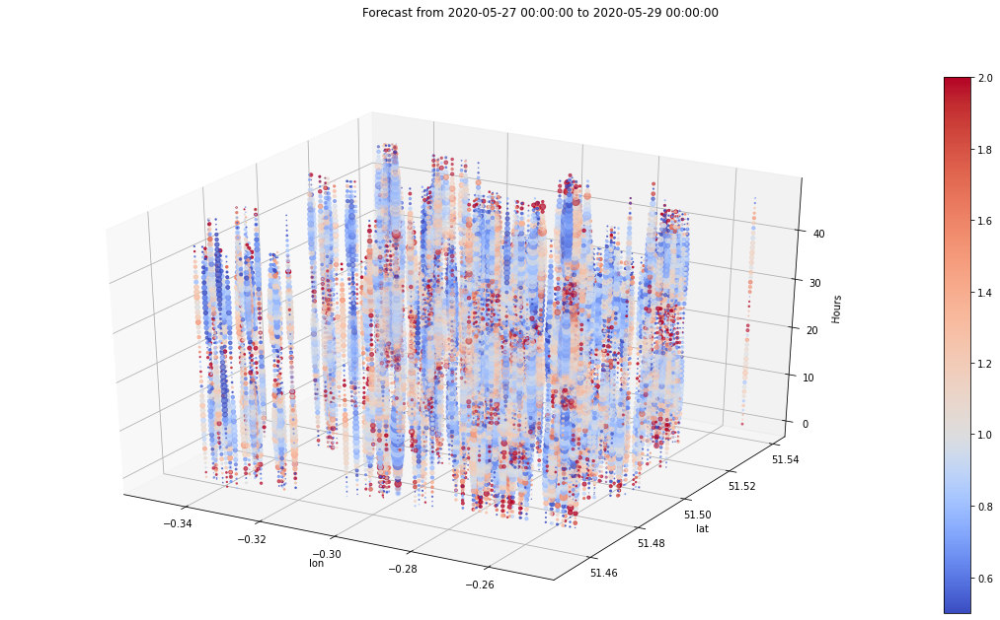

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 7.66 seconds
Search spatial regions with t_min = 2020-05-27 00:00:00 and t_max = 2020-05-29 00:00:00
No Outbreak Posterior: 0.9933479313299028
Total Outbreak Posterior: 0.00665206867009724

32448 space-time regions searched in 88.97 seconds
Total run time: 96.63 seconds


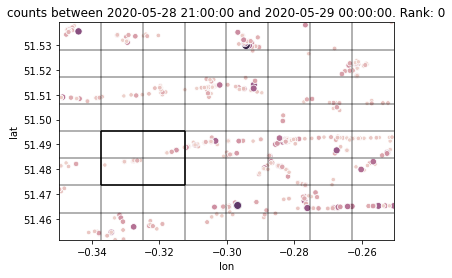


Analysis day: 2020-05-30 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-05-30 00:00:00.
Using data from 2020-04-30 00:00:00 to 2020-05-28 00:00:00, to forecast counts
 between 2020-05-28 00:00:00 and 2020-05-30 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


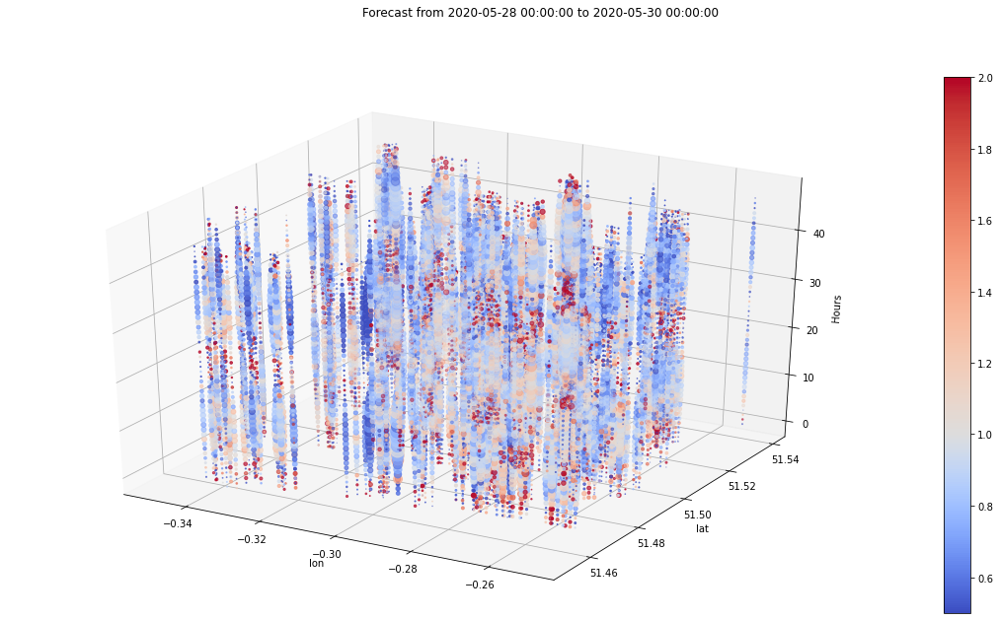

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.20 seconds
Search spatial regions with t_min = 2020-05-28 00:00:00 and t_max = 2020-05-30 00:00:00
No Outbreak Posterior: 0.9932669596145355
Total Outbreak Posterior: 0.006733040385464599

32448 space-time regions searched in 110.49 seconds
Total run time: 118.70 seconds


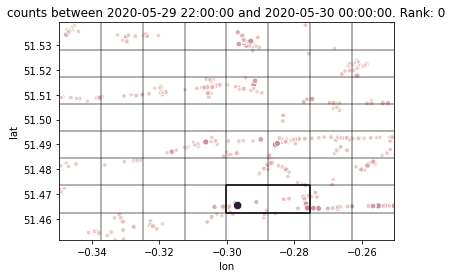


Analysis day: 2020-05-31 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-05-31 00:00:00.
Using data from 2020-05-01 00:00:00 to 2020-05-29 00:00:00, to forecast counts
 between 2020-05-29 00:00:00 and 2020-05-31 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


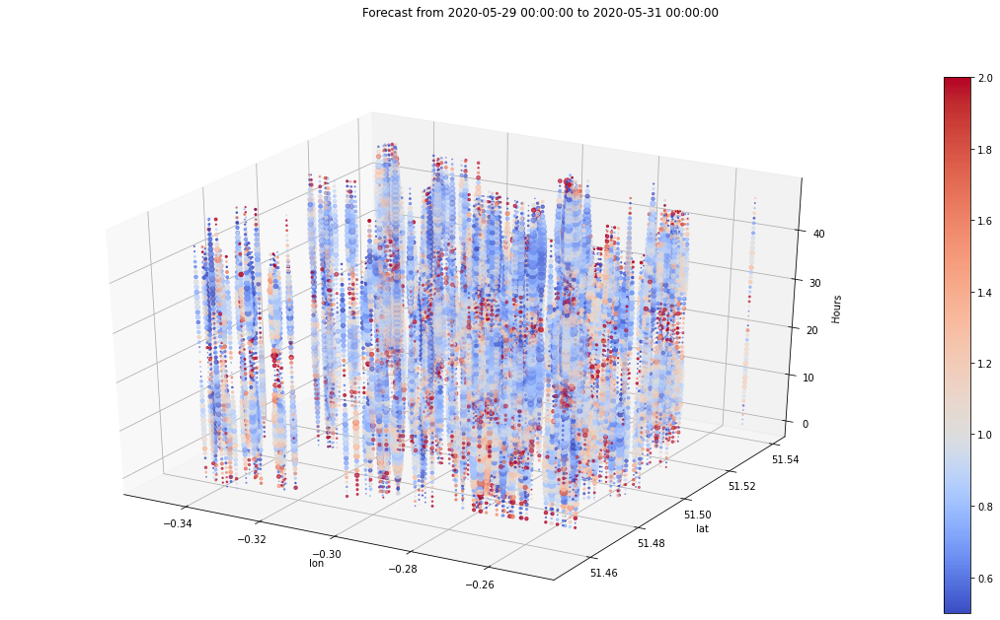

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.27 seconds
Search spatial regions with t_min = 2020-05-29 00:00:00 and t_max = 2020-05-31 00:00:00
No Outbreak Posterior: 0.9932810537715405
Total Outbreak Posterior: 0.006718946228459576

32448 space-time regions searched in 103.91 seconds
Total run time: 112.18 seconds


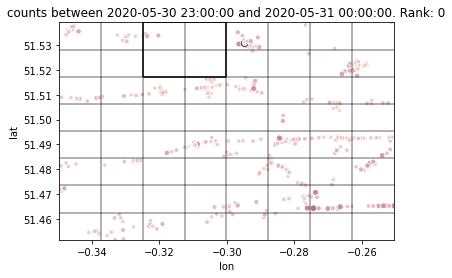


Analysis day: 2020-06-01 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-06-01 00:00:00.
Using data from 2020-05-02 00:00:00 to 2020-05-30 00:00:00, to forecast counts
 between 2020-05-30 00:00:00 and 2020-06-01 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


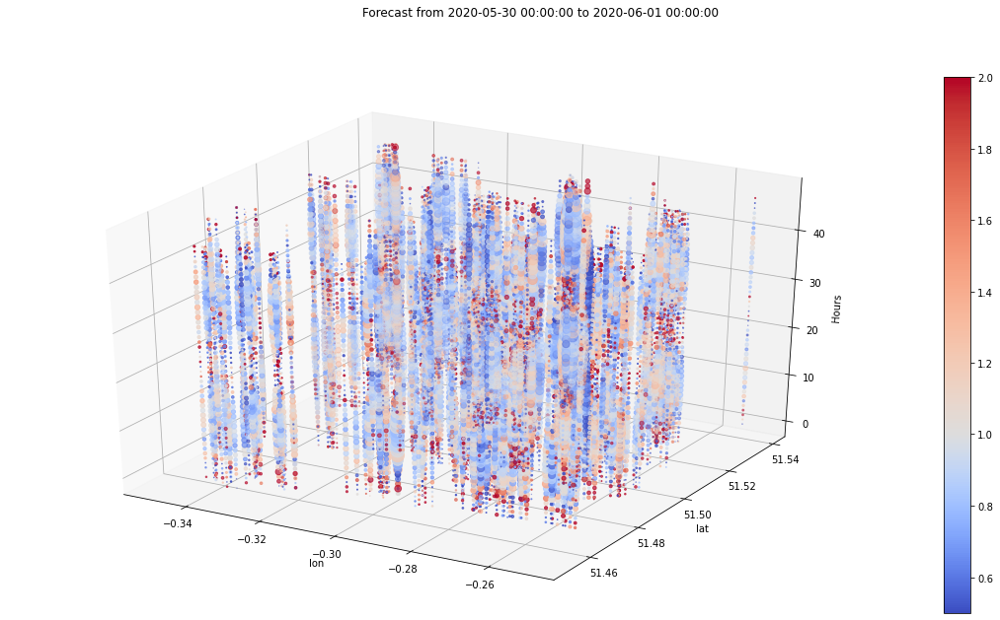

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.40 seconds
Search spatial regions with t_min = 2020-05-30 00:00:00 and t_max = 2020-06-01 00:00:00
No Outbreak Posterior: 0.9933508002161626
Total Outbreak Posterior: 0.006649199783837306

32448 space-time regions searched in 92.44 seconds
Total run time: 100.84 seconds


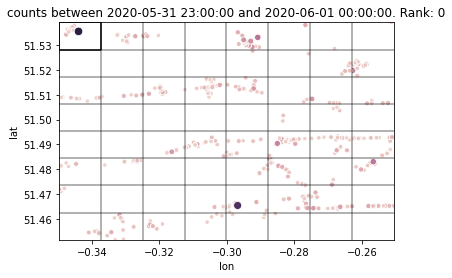


Analysis day: 2020-06-02 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-06-02 00:00:00.
Using data from 2020-05-03 00:00:00 to 2020-05-31 00:00:00, to forecast counts
 between 2020-05-31 00:00:00 and 2020-06-02 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


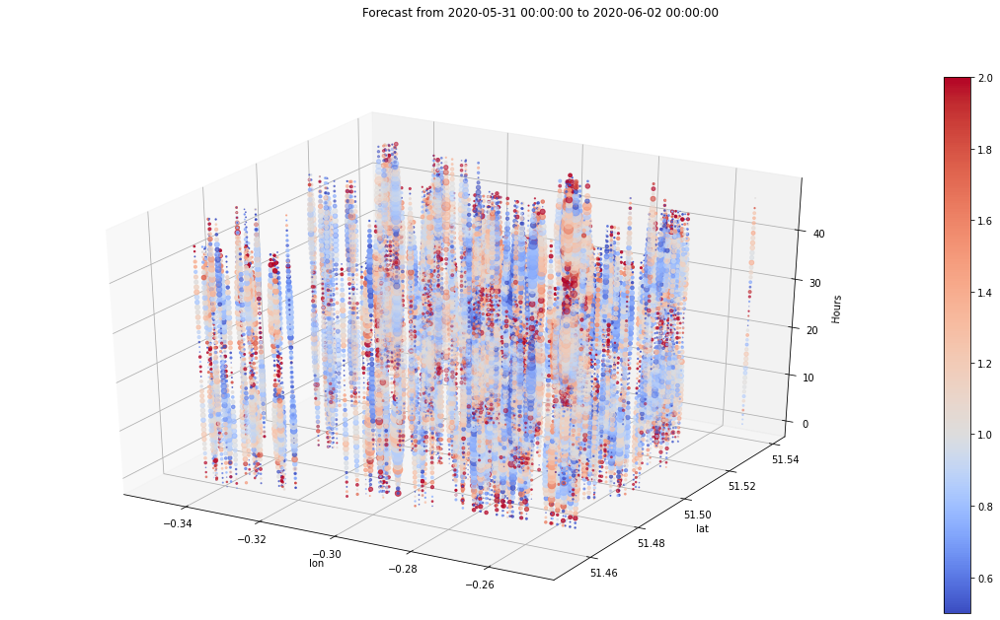

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.83 seconds
Search spatial regions with t_min = 2020-05-31 00:00:00 and t_max = 2020-06-02 00:00:00
No Outbreak Posterior: 0.9934153825025069
Total Outbreak Posterior: 0.006584617497493086

32448 space-time regions searched in 104.09 seconds
Total run time: 112.91 seconds


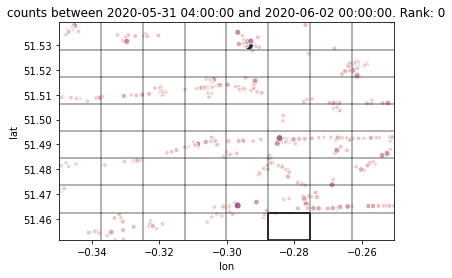


Analysis day: 2020-06-03 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-06-03 00:00:00.
Using data from 2020-05-04 00:00:00 to 2020-06-01 00:00:00, to forecast counts
 between 2020-06-01 00:00:00 and 2020-06-03 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


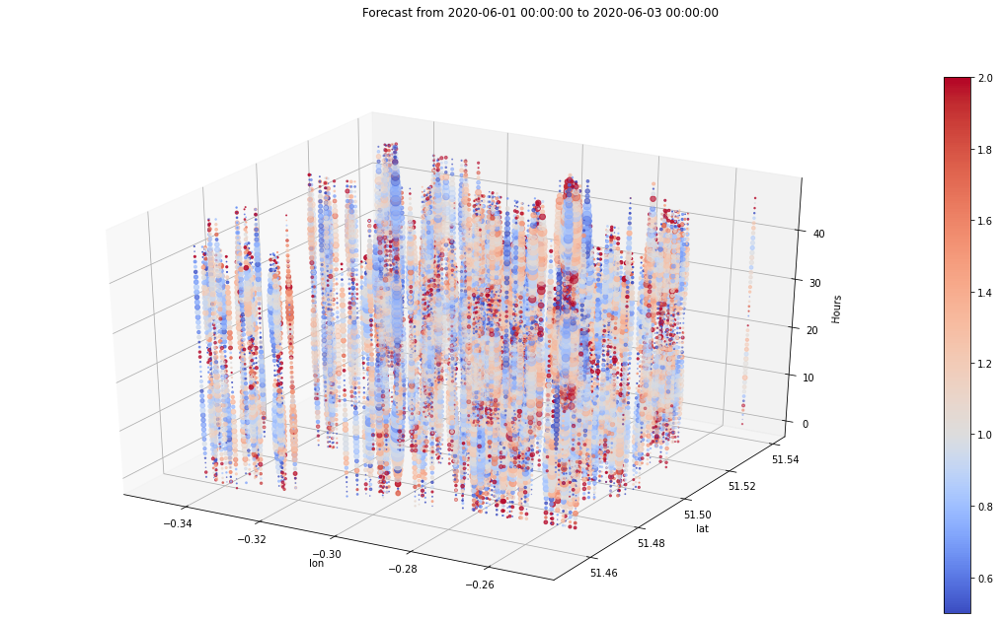

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.88 seconds
Search spatial regions with t_min = 2020-06-01 00:00:00 and t_max = 2020-06-03 00:00:00
No Outbreak Posterior: 0.9934572536581698
Total Outbreak Posterior: 0.0065427463418301045

32448 space-time regions searched in 102.00 seconds
Total run time: 110.88 seconds


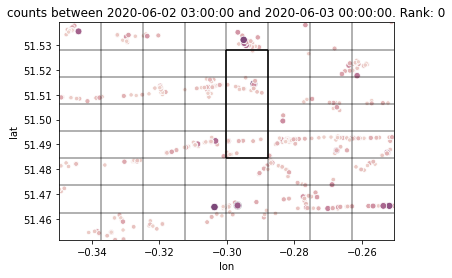


Analysis day: 2020-06-04 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-06-04 00:00:00.
Using data from 2020-05-05 00:00:00 to 2020-06-02 00:00:00, to forecast counts
 between 2020-06-02 00:00:00 and 2020-06-04 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


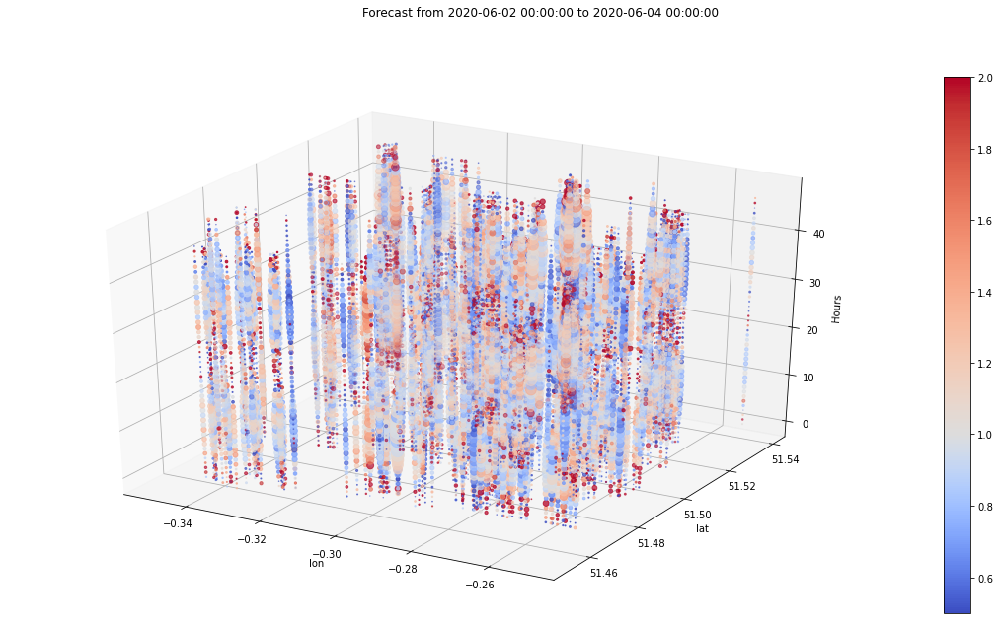

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 8.18 seconds
Search spatial regions with t_min = 2020-06-02 00:00:00 and t_max = 2020-06-04 00:00:00
No Outbreak Posterior: 0.9934183433715587
Total Outbreak Posterior: 0.006581656628441302

32448 space-time regions searched in 104.28 seconds
Total run time: 112.46 seconds


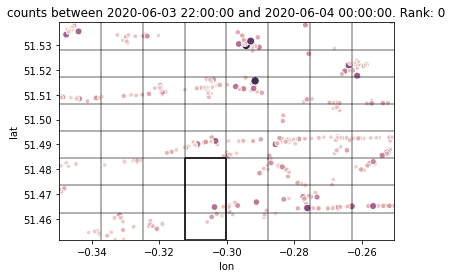


Analysis day: 2020-06-05 00:00:00. Looking back at last 48 hours.
Input dataframe contains data spanning 2020-04-26 00:00:00 to 2020-06-05 00:00:00.
Using data from 2020-05-06 00:00:00 to 2020-06-03 00:00:00, to forecast counts
 between 2020-06-03 00:00:00 and 2020-06-05 00:00:00 for 458 detectors using HW method...
Forecasting complete.
Dates in datetime format. Moving to next stage.

0 NaN values found in 'count' column. Dropping these from the dataframe.
0 NaN values found in 'baseline' column. Dropping these from the dataframe.

All baseline predictions >= 0.

Data cleansing complete. 0 rows removed from dataframe.


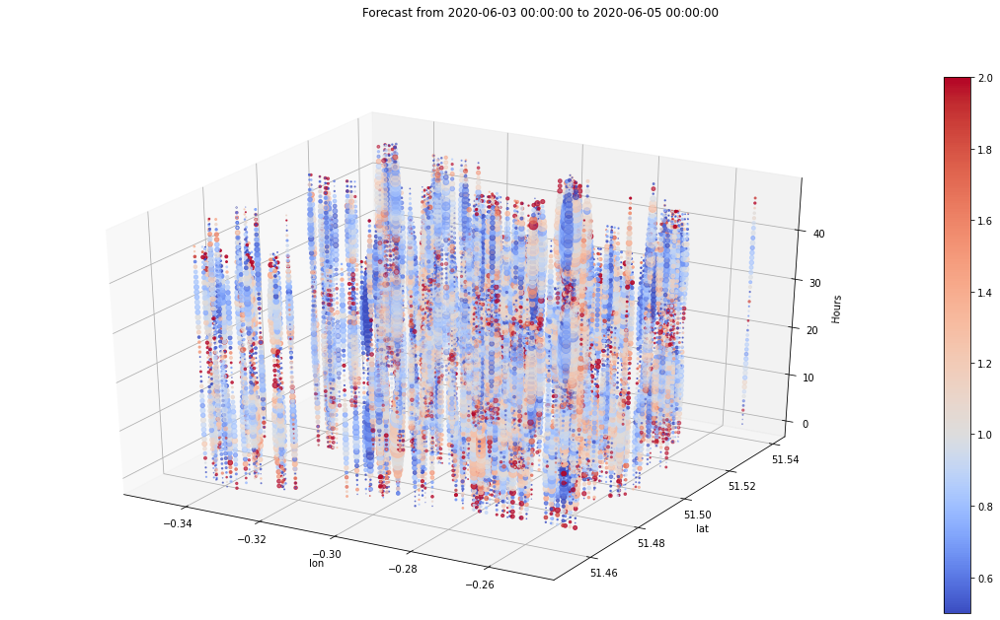

Aggregating data from detector level to grid level.
Beginning normal scan. Setup Time: 7.92 seconds
Search spatial regions with t_min = 2020-06-03 00:00:00 and t_max = 2020-06-05 00:00:00
No Outbreak Posterior: 0.9933240307258483
Total Outbreak Posterior: 0.0066759692741517026

32448 space-time regions searched in 97.23 seconds
Total run time: 105.15 seconds


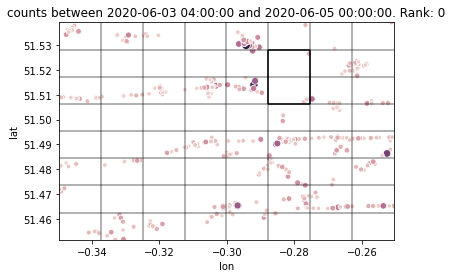

In [11]:
database_results, highest_regions = results_builder(outbreak_df, outbreak_detectors, outbreak_start, hist,
                                                    days_in_past=DAYS_IN_PAST, days_in_future=DAYS_IN_FUTURE, method='HW',
                                                    grid_partition=8, scan_type='normal', show_plots=True)

In [12]:
database_results

,start_time_utc,end_time_utc,point_id,x_min,x_max,y_min,y_max,observed_count,forecasted_count,av_lhd_score_EBP,av_lhd_score_eps_000,av_lhd_score_eps_025,av_lhd_score_eps_050,av_posterior_bbayes
0,2020-05-24 00:00:00,2020-05-26,0,-0.349749,-0.337352,51.451503,51.462464,4.646295,4.816472,1.000000,0.000168,-0.005109,-0.020522,2.213902e-07
1,2020-05-24 00:00:00,2020-05-26,1,-0.337352,-0.324954,51.451503,51.462464,9.950947,10.407107,1.000000,0.000125,-0.006783,-0.025970,2.208814e-07
2,2020-05-24 00:00:00,2020-05-26,2,-0.324954,-0.312557,51.451503,51.462464,14.745775,15.593516,1.000000,0.000049,-0.008425,-0.030415,2.191219e-07
3,2020-05-24 00:00:00,2020-05-26,3,-0.312557,-0.300159,51.451503,51.462464,20.206785,21.403554,1.000007,0.000086,-0.009883,-0.035227,2.146560e-07
4,2020-05-24 00:00:00,2020-05-26,4,-0.300159,-0.287762,51.451503,51.462464,25.294740,27.033659,1.000002,0.000009,-0.012852,-0.043604,2.088439e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18427,2020-06-04 23:00:00,2020-06-05,59,-0.312557,-0.300159,51.528227,51.539188,0.096052,0.103874,1.000000,0.000001,-0.000060,-0.000207,2.111486e-07
18428,2020-06-04 23:00:00,2020-06-05,60,-0.300159,-0.287762,51.528227,51.539188,0.132370,0.137398,1.000001,0.000015,-0.000040,-0.000200,2.034653e-07
18429,2020-06-04 23:00:00,2020-06-05,61,-0.287762,-0.275364,51.528227,51.539188,0.087116,0.093509,1.000000,0.000002,-0.000053,-0.000189,2.105981e-07
18430,2020-06-04 23:00:00,2020-06-05,62,-0.275364,-0.262967,51.528227,51.539188,0.052931,0.060857,1.000000,-0.000013,-0.000080,-0.000218,2.193655e-07


In [22]:
highest_regions2 = highest_regions.drop(['F_thresh_fp=0.05', 'F_thresh_fp=0.10', 'F_thresh_fp=0.25', 'F_thresh_fp=0.00', 'F_thresh_fp=0.50',
                                         'detected_fp=0.00', 'posterior_bbayes'], axis=1)
highest_regions2

,x_min,x_max,y_min,y_max,t_min,t_max,l_score_EBP,precision,recall,day,days_since_outbreak,detected_fp=0.05,detected_fp=0.10,detected_fp=0.25,detected_fp=0.50
0,-0.262967,-0.250570,51.473424,51.484385,2020-05-24 01:00:00,2020-05-26,1.000264,0.000000,0.00,2020-05-26,-5,False,False,False,True
1,-0.324954,-0.275364,51.495345,51.506306,2020-05-25 10:00:00,2020-05-27,1.000549,0.000000,0.00,2020-05-27,-4,False,True,True,True
2,-0.300159,-0.287762,51.462464,51.473424,2020-05-26 03:00:00,2020-05-28,1.000455,0.000000,0.00,2020-05-28,-3,False,False,True,True
3,-0.337352,-0.312557,51.473424,51.495345,2020-05-28 21:00:00,2020-05-29,1.000068,0.000000,0.00,2020-05-29,-2,False,False,False,False
4,-0.300159,-0.275364,51.462464,51.473424,2020-05-29 22:00:00,2020-05-30,1.000143,0.000000,0.00,2020-05-30,-1,False,False,False,False
5,-0.324954,-0.300159,51.517267,51.539188,2020-05-30 23:00:00,2020-05-31,1.000057,0.000000,0.00,2020-05-31,0,False,False,False,False
6,-0.349749,-0.337352,51.528227,51.539188,2020-05-31 23:00:00,2020-06-01,1.000159,0.000000,0.00,2020-06-01,1,False,False,False,False
7,-0.287762,-0.275364,51.451503,51.462464,2020-05-31 04:00:00,2020-06-02,1.000217,0.000000,0.00,2020-06-02,2,False,False,False,True
8,-0.300159,-0.287762,51.484385,51.528227,2020-06-02 03:00:00,2020-06-03,1.000396,0.466667,0.28,2020-06-03,3,False,False,True,True
9,-0.312557,-0.300159,51.451503,51.484385,2020-06-03 22:00:00,2020-06-04,1.000285,0.000000,0.00,2020-06-04,4,False,False,False,True


Dataframe contains data from the database spanning 2020-05-24 00:00:00 to 2020-06-05 00:00:00.


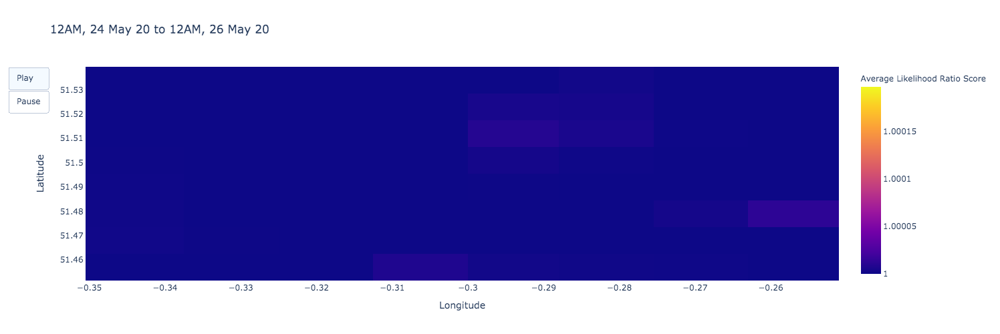

{'max': 1.0001972957344387, 'min': 1.0}

In [14]:
visualise_results_from_database(database_results)